In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import DataScienceHelper as dsh
# import plotly.express as px
from sklearn.model_selection import train_test_split 
from sklearn.metrics import accuracy_score

%matplotlib inline
import time
from datetime import datetime
import re
from math import *
pd.pandas.set_option("display.max_rows",None)
from pandas_profiling import ProfileReport

In [31]:
!pip install DataScienceHelper

  Using cached datasciencehelper-1.5.2-py3-none-any.whl


In [3]:
df=pd.read_csv('C:/Electricityconsumption/train.csv') # loading the dataset

In [4]:
df.shape # size of dataset

(26496, 8)

In [5]:
df.head()

,ID,datetime,temperature,var1,pressure,windspeed,var2,electricity_consumption
0,0,2013-07-01 00:00:00,-11.4,-17.1,1003.0,571.910,A,216.0
1,1,2013-07-01 01:00:00,-12.1,-19.3,996.0,575.040,A,210.0
2,2,2013-07-01 02:00:00,-12.9,-20.0,1000.0,578.435,A,225.0
3,3,2013-07-01 03:00:00,-11.4,-17.1,995.0,582.580,A,216.0
4,4,2013-07-01 04:00:00,-11.4,-19.3,1005.0,586.600,A,222.0


In [6]:
df.tail()

,ID,datetime,temperature,var1,pressure,windspeed,var2,electricity_consumption
26491,34891,2017-06-23 19:00:00,-0.7,-15.0,1009.0,51.685,A,225.0
26492,34892,2017-06-23 20:00:00,-2.9,-11.4,1005.0,56.105,A,213.0
26493,34893,2017-06-23 21:00:00,-1.4,-12.9,995.0,61.275,A,213.0
26494,34894,2017-06-23 22:00:00,-2.9,-11.4,996.0,67.210,A,210.0
26495,34895,2017-06-23 23:00:00,-2.1,-11.4,1009.0,71.880,A,210.0


In [7]:
df.isnull().sum()# no null values found

ID                         0
datetime                   0
temperature                0
var1                       0
pressure                   0
windspeed                  0
var2                       0
electricity_consumption    0
dtype: int64

In [8]:
df.describe() # distribution of data and five point summary

,ID,temperature,var1,pressure,windspeed,electricity_consumption
count,26496.000000,26496.000000,26496.000000,26496.000000,26496.000000,26496.000000
mean,17455.500000,5.098989,-1.916233,986.450615,23.959956,298.359601
std,10122.873673,8.682860,10.424860,12.002647,48.280321,108.020555
min,0.000000,-17.100000,-32.900000,953.000000,1.075000,174.000000
25%,8717.750000,-2.900000,-10.700000,978.000000,3.155000,219.000000
50%,17435.500000,6.400000,-1.400000,986.000000,6.545000,267.000000
75%,26177.250000,12.100000,7.900000,995.000000,22.260000,342.000000
max,34895.000000,23.600000,18.600000,1024.000000,586.600000,1386.000000


In [9]:
df.count()

ID                         26496
datetime                   26496
temperature                26496
var1                       26496
pressure                   26496
windspeed                  26496
var2                       26496
electricity_consumption    26496
dtype: int64

In [10]:
df.info()# object column and int column 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       26496 non-null  int64  
 1   datetime                 26496 non-null  object 
 2   temperature              26496 non-null  float64
 3   var1                     26496 non-null  float64
 4   pressure                 26496 non-null  float64
 5   windspeed                26496 non-null  float64
 6   var2                     26496 non-null  object 
 7   electricity_consumption  26496 non-null  float64
dtypes: float64(5), int64(1), object(2)
memory usage: 1.6+ MB


Text(0, 0.5, 'frequency')

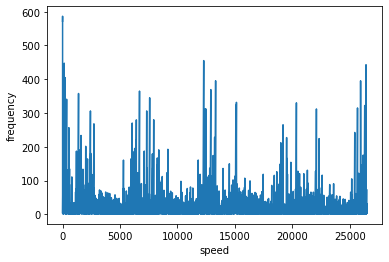

In [11]:
plt.plot(df.windspeed)
plt.xlabel('speed')
plt.ylabel('frequency')

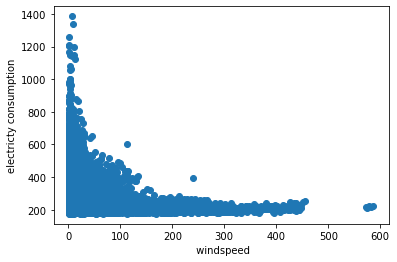

In [12]:
plt.scatter(df.windspeed,df.electricity_consumption)
plt.xlabel(" windspeed")
plt.ylabel("electricty consumption")
plt.show()

In [18]:
df['Dates'] = pd.to_datetime(df['datetime']).dt.date
df['Time'] = pd.to_datetime(df['datetime']).dt.time

In [14]:
df1=df.copy()

In [15]:
df1.head()

,ID,datetime,temperature,var1,pressure,windspeed,var2,electricity_consumption,Dates,Time
0,0,2013-07-01 00:00:00,-11.4,-17.1,1003.0,571.910,A,216.0,2013-07-01,00:00:00
1,1,2013-07-01 01:00:00,-12.1,-19.3,996.0,575.040,A,210.0,2013-07-01,01:00:00
2,2,2013-07-01 02:00:00,-12.9,-20.0,1000.0,578.435,A,225.0,2013-07-01,02:00:00
3,3,2013-07-01 03:00:00,-11.4,-17.1,995.0,582.580,A,216.0,2013-07-01,03:00:00
4,4,2013-07-01 04:00:00,-11.4,-19.3,1005.0,586.600,A,222.0,2013-07-01,04:00:00


In [16]:
df1.drop('datetime',axis=1)

,ID,temperature,var1,pressure,windspeed,var2,electricity_consumption,Dates,Time
0,0,-11.4,-17.1,1003.0,571.910,A,216.0,2013-07-01,00:00:00
1,1,-12.1,-19.3,996.0,575.040,A,210.0,2013-07-01,01:00:00
2,2,-12.9,-20.0,1000.0,578.435,A,225.0,2013-07-01,02:00:00
3,3,-11.4,-17.1,995.0,582.580,A,216.0,2013-07-01,03:00:00
4,4,-11.4,-19.3,1005.0,586.600,A,222.0,2013-07-01,04:00:00
5,5,-10.7,-19.3,1013.0,2.790,A,216.0,2013-07-01,05:00:00
6,6,-13.6,-17.1,1006.0,4.380,A,219.0,2013-07-01,06:00:00
7,7,-11.4,-17.9,997.0,7.635,A,222.0,2013-07-01,07:00:00
8,8,-10.7,-18.6,1012.0,12.055,A,219.0,2013-07-01,08:00:00
9,9,-10.0,-16.4,1002.0,17.975,A,222.0,2013-07-01,09:00:00


<AxesSubplot:xlabel='var2'>

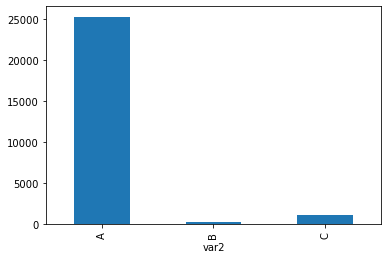

In [17]:
df.groupby('var2')['electricity_consumption'].count().plot.bar()

In [19]:
df1['Dates']= pd.to_datetime(df['Dates'])

In [20]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ID                       26496 non-null  int64         
 1   datetime                 26496 non-null  object        
 2   temperature              26496 non-null  float64       
 3   var1                     26496 non-null  float64       
 4   pressure                 26496 non-null  float64       
 5   windspeed                26496 non-null  float64       
 6   var2                     26496 non-null  object        
 7   electricity_consumption  26496 non-null  float64       
 8   Dates                    26496 non-null  datetime64[ns]
 9   Time                     26496 non-null  object        
dtypes: datetime64[ns](1), float64(5), int64(1), object(3)
memory usage: 2.0+ MB


<AxesSubplot:>

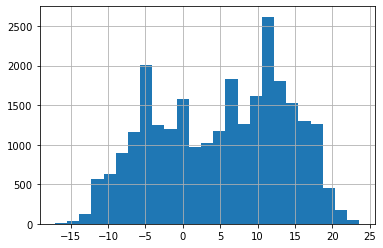

In [22]:
df.temperature.hist(bins=25)

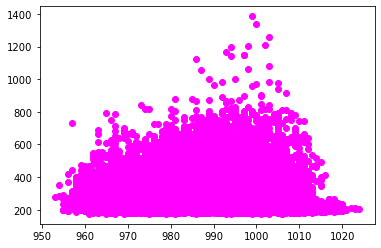

In [23]:
plt.scatter(df.pressure,df.electricity_consumption,c='magenta')

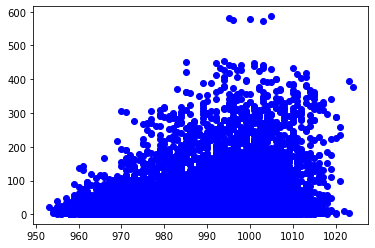

In [24]:
plt.scatter(df.pressure,df.windspeed,c='blue')

{'whiskers': [<matplotlib.lines.Line2D at 0x5ead8504c0>,
 'caps': [<matplotlib.lines.Line2D at 0x5ead850520>,
 'boxes': [<matplotlib.lines.Line2D at 0x5ead850d00>],
 'medians': [<matplotlib.lines.Line2D at 0x5ead84e6d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x5eae443430>],
 'means': []}

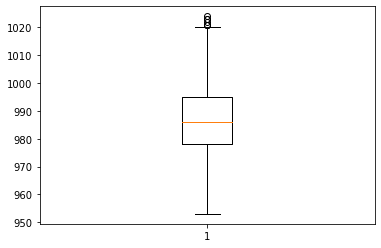

In [25]:
plt.boxplot(df.pressure)


{'whiskers': [<matplotlib.lines.Line2D at 0x5eae4b5430>,
 'caps': [<matplotlib.lines.Line2D at 0x5eae4b5af0>,
 'boxes': [<matplotlib.lines.Line2D at 0x5eae4b50d0>],
 'medians': [<matplotlib.lines.Line2D at 0x5eae4c11f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x5eae4c1550>],
 'means': []}

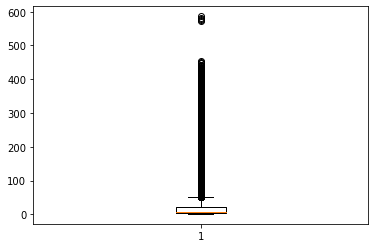

In [26]:
plt.boxplot(df.windspeed)

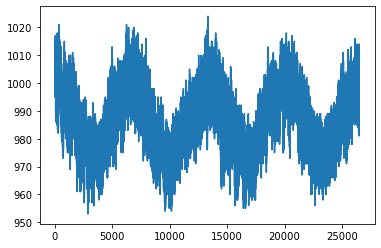

In [34]:
plt.plot(df.pressure)

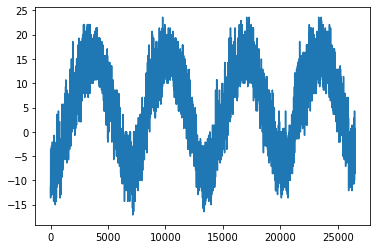

In [36]:
plt.plot(df.temperature)

<AxesSubplot:>

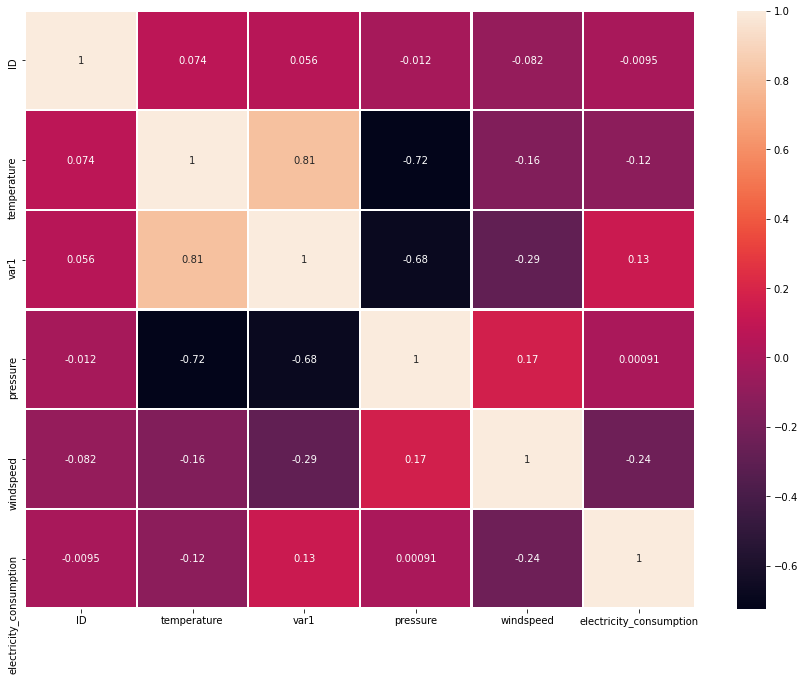

In [43]:
fig,ax = plt.subplots(figsize = (15,11))
correlation = df.corr()
sns.heatmap(correlation,xticklabels = corr.columns,annot = True,yticklabels = corr.columns,linewidth =1.2)